<a href="https://colab.research.google.com/github/AnushaV01/Lung-disease-prediction/blob/main/Principal_Component_Analysis_and_Lung_Cancer_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Principal Component Analysis and Lung Cancer Prediction**

**Install Pycaret**

In [1]:
!pip install pycaret==3.0.0

  Using cached pycaret-3.0.0-py3-none-any.whl (481 kB)
  Attempting uninstall: pycaret
    Found existing installation: pycaret 3.2.0
    Uninstalling pycaret-3.2.0:
      Successfully uninstalled pycaret-3.2.0


**Import Libraries**

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [3]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.5.3
Seaborn version:  0.12.2


**Dataset**

The “Lung Cancer prediction Data Set” used for Principle Component Analysis (PCA) and classification models is obtained from Kaggle. The data set provided information about  attributes to predict the likelihood of getting lung cancer is low or high.

There are 24 attributes with 1000 entries and one column for classification.
**0 represents low chance and 1 represents High.**


All attributes are numerical and they are listed bellow:
1. Index
2. Age- Numerical
2. Gender - 	Categorical
3. Air Pollution	- Categorical
4. Alcohol- Categorical
5. Balanced Diet	- Categorical
6. Obesity - Categorical
7. Smoking	- Categorical
8. Passive Smoker- The level of passive smoker of the patient - Categorical
9. Chest Pain - The level of chest pain of the patient - Categorical
10. Coughing of Blood- The level of coughing of blood of the patient - Categorical
11. Fatigue- The level of fatigue of the patient - Categorical
12. Weight Loss- The level of weight loss of the patient - Categorical
13.Shortness of Breath - The level of shortness of breath of the patient - Categorical
13. Dust Allergy - The level of dust allergy of the patient - Categorical
14. OccuPational Hazards - The level of occupational hazards of the patient - Categorical
15. Genetic Risk - The level of genetic risk of the patient - Categorical
16. chronic Lung Disease- The level of chronic lung disease of the patient - Categorical
17. Wheezing	The level of wheezing of the patient - Categorical
18. Swallowing Difficulty	The level of swallowing difficulty of the patient - Categorical
19. Clubbing of Finger Nails	The level of clubbing of finger nails of the patient - Categorical
20. Frequent Cold - Categorical
21. Dry cough _ categorical
22. Snoring - Categorical

Attributes 4-21 are on scale of 8
Attributes 22-24 are on scale of 7


The original dataset can be found on below link:
https://www.kaggle.com/datasets/thedevastator/cancer-patients-and-air-pollution-a-new-link/





In [4]:
#read cvs file into dataframe
df = pd.read_csv('https://github.com/AnushaV01/Lung-disease-prediction/raw/main/Lung%20disease%202.csv')
df.head(25)

,index,Age,Gender,Air Pollution,Alcohol use,Dust Allergy,OccuPational Hazards,Genetic Risk,chronic Lung Disease,Balanced Diet,...,Fatigue,Weight Loss,Shortness of Breath,Wheezing,Swal0ing Difficulty,Clubbing of Finger Nails,Frequent Cold,Dry Cough,Snoring,Level
0,0,33,1,2,4,5,4,3,2,2,...,3,4,2,2,3,1,2,3,4,0
1,1,17,1,3,1,5,3,4,2,2,...,1,3,7,8,6,2,1,7,2,0
2,2,35,1,4,5,6,5,5,4,6,...,8,7,9,2,1,4,6,7,2,1
3,3,37,1,7,7,7,7,6,7,7,...,4,2,3,1,4,5,6,7,5,1
4,4,46,1,6,8,7,7,7,6,7,...,3,2,4,1,4,2,4,2,3,1
5,5,35,1,4,5,6,5,5,4,6,...,8,7,9,2,1,4,6,7,2,1
6,6,52,2,2,4,5,4,3,2,2,...,3,4,2,2,3,1,2,3,4,0
7,7,28,2,3,1,4,3,2,3,4,...,3,2,2,4,2,2,3,4,3,0
8,8,35,2,4,5,6,5,6,5,5,...,1,4,3,2,4,6,2,4,1,0
9,9,46,1,2,3,4,2,4,3,3,...,1,2,4,6,5,4,2,1,5,0


In [5]:
len(df.index)

1000

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   index                     1000 non-null   int64
 1   Age                       1000 non-null   int64
 2   Gender                    1000 non-null   int64
 3   Air Pollution             1000 non-null   int64
 4   Alcohol use               1000 non-null   int64
 5   Dust Allergy              1000 non-null   int64
 6   OccuPational Hazards      1000 non-null   int64
 7   Genetic Risk              1000 non-null   int64
 8   chronic Lung Disease      1000 non-null   int64
 9   Balanced Diet             1000 non-null   int64
 10  Obesity                   1000 non-null   int64
 11  Smoking                   1000 non-null   int64
 12  Passive Smoker            1000 non-null   int64
 13  Chest Pain                1000 non-null   int64
 14  Coughing of Blood         1000 non-null  

In [7]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [8]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

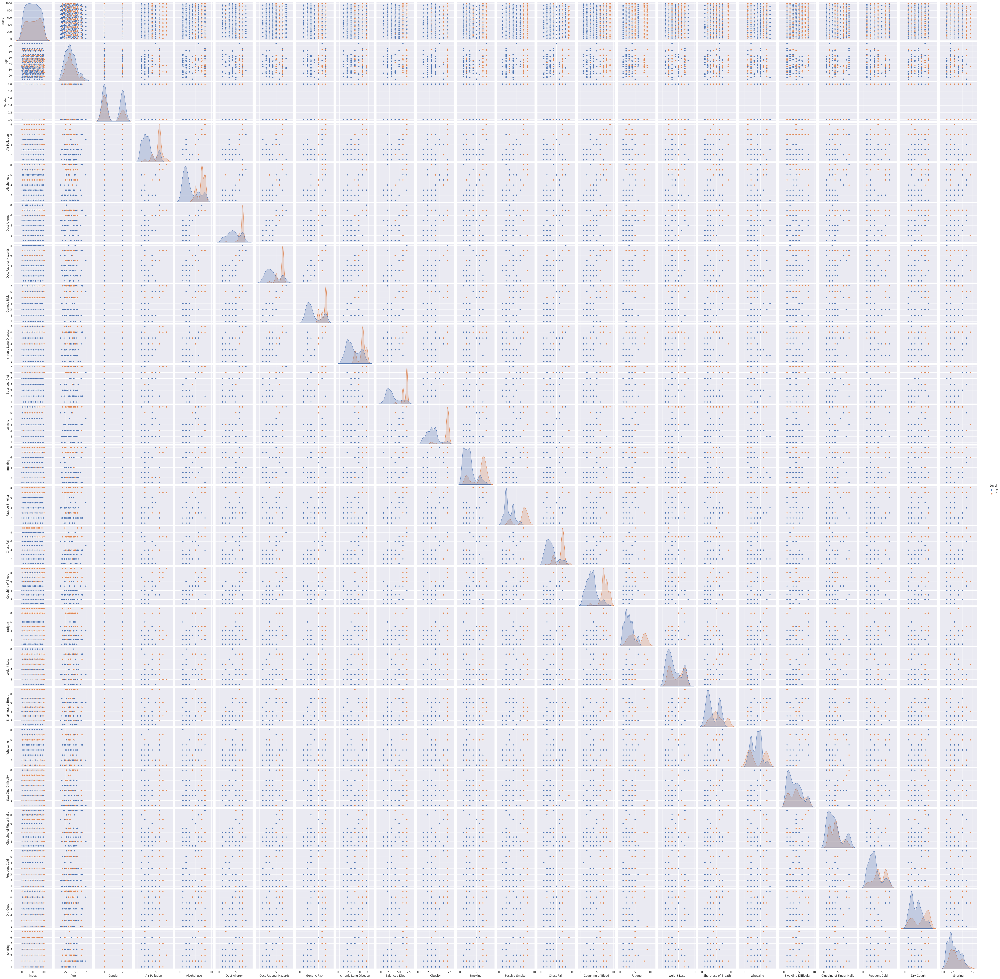

In [9]:
sns.pairplot(df, hue='Level')
plt.show()

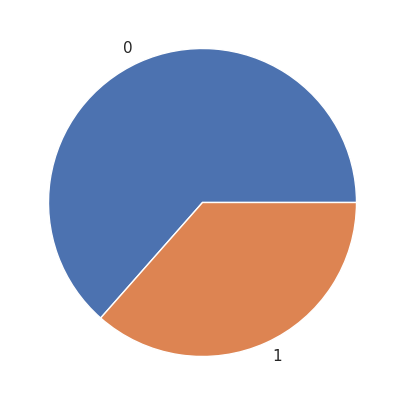

In [10]:
y =df['Level']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [11]:
X = df.drop(columns=['Level'])
X.head(10)

,index,Age,Gender,Air Pollution,Alcohol use,Dust Allergy,OccuPational Hazards,Genetic Risk,chronic Lung Disease,Balanced Diet,...,Coughing of Blood,Fatigue,Weight Loss,Shortness of Breath,Wheezing,Swal0ing Difficulty,Clubbing of Finger Nails,Frequent Cold,Dry Cough,Snoring
0,0,33,1,2,4,5,4,3,2,2,...,4,3,4,2,2,3,1,2,3,4
1,1,17,1,3,1,5,3,4,2,2,...,3,1,3,7,8,6,2,1,7,2
2,2,35,1,4,5,6,5,5,4,6,...,8,8,7,9,2,1,4,6,7,2
3,3,37,1,7,7,7,7,6,7,7,...,8,4,2,3,1,4,5,6,7,5
4,4,46,1,6,8,7,7,7,6,7,...,9,3,2,4,1,4,2,4,2,3
5,5,35,1,4,5,6,5,5,4,6,...,8,8,7,9,2,1,4,6,7,2
6,6,52,2,2,4,5,4,3,2,2,...,4,3,4,2,2,3,1,2,3,4
7,7,28,2,3,1,4,3,2,3,4,...,1,3,2,2,4,2,2,3,4,3
8,8,35,2,4,5,6,5,6,5,5,...,5,1,4,3,2,4,6,2,4,1
9,9,46,1,2,3,4,2,4,3,3,...,4,1,2,4,6,5,4,2,1,5


In [12]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
index,1000.0,499.500,288.819436,0.0,249.75,499.5,749.25,999.0
Age,1000.0,37.174,12.005493,14.0,27.75,36.0,45.00,73.0
Gender,1000.0,1.402,0.490547,1.0,1.00,1.0,2.00,2.0
Air Pollution,1000.0,3.840,2.030400,1.0,2.00,3.0,6.00,8.0
Alcohol use,1000.0,4.563,2.620477,1.0,2.00,5.0,7.00,8.0
Dust Allergy,1000.0,5.165,1.980833,1.0,4.00,6.0,7.00,8.0
OccuPational Hazards,1000.0,4.840,2.107805,1.0,3.00,5.0,7.00,8.0
Genetic Risk,1000.0,4.580,2.126999,1.0,2.00,5.0,7.00,7.0
chronic Lung Disease,1000.0,4.380,1.848518,1.0,3.00,4.0,6.00,7.0
Balanced Diet,1000.0,4.491,2.135528,1.0,2.00,4.0,7.00,7.0


**Standardize the Data**

In [13]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,index,Age,Gender,Air Pollution,Alcohol use,Dust Allergy,OccuPational Hazards,Genetic Risk,chronic Lung Disease,Balanced Diet,...,Coughing of Blood,Fatigue,Weight Loss,Shortness of Breath,Wheezing,Swal0ing Difficulty,Clubbing of Finger Nails,Frequent Cold,Dry Cough,Snoring
0,-1.730320,-0.347848,-0.819903,-0.906679,-0.214954,-0.083340,-0.398718,-0.743202,-1.288162,-1.167040,...,-0.353971,-0.381548,0.065746,-0.980760,-0.870694,-0.328743,-1.224625,-0.838618,-0.418550,0.728655
1,-1.726856,-1.681238,-0.819903,-0.413919,-1.360357,-0.083340,-0.873383,-0.272821,-1.288162,-1.167040,...,-0.766045,-1.273014,-0.387677,1.208436,2.069186,0.993281,-0.805663,-1.384593,1.544171,-0.628245
2,-1.723391,-0.181174,-0.819903,0.078842,0.166847,0.421751,0.075946,0.197560,-0.205673,0.706970,...,1.294323,1.847119,1.426018,2.084114,-0.870694,-1.210093,0.032260,1.345283,1.544171,-0.628245
3,-1.719927,-0.014501,-0.819903,1.557123,0.930449,0.926842,1.025275,0.667941,1.418061,1.175473,...,1.294323,0.064186,-0.841101,-0.542921,-1.360675,0.111931,0.451222,1.345283,1.544171,1.407105
4,-1.716463,0.735531,-0.819903,1.064362,1.312250,0.926842,1.025275,1.138323,0.876816,1.175473,...,1.706397,-0.381548,-0.841101,-0.105081,-1.360675,0.111931,-0.805663,0.253332,-0.909231,0.050205
5,-1.712999,-0.181174,-0.819903,0.078842,0.166847,0.421751,0.075946,0.197560,-0.205673,0.706970,...,1.294323,1.847119,1.426018,2.084114,-0.870694,-1.210093,0.032260,1.345283,1.544171,-0.628245
6,-1.709535,1.235553,1.219657,-0.906679,-0.214954,-0.083340,-0.398718,-0.743202,-1.288162,-1.167040,...,-0.353971,-0.381548,0.065746,-0.980760,-0.870694,-0.328743,-1.224625,-0.838618,-0.418550,0.728655
7,-1.706071,-0.764533,1.219657,-0.413919,-1.360357,-0.588431,-0.873383,-1.213584,-0.746918,-0.230035,...,-1.590192,-0.381548,-0.841101,-0.980760,0.109266,-0.769418,-0.805663,-0.292643,0.072130,0.050205
8,-1.702607,-0.181174,1.219657,0.078842,0.166847,0.421751,0.075946,0.667941,0.335572,0.238468,...,0.058102,-1.273014,0.065746,-0.542921,-0.870694,0.111931,0.870183,-0.838618,0.072130,-1.306694
9,-1.699143,0.735531,-0.819903,-0.906679,-0.596755,-0.588431,-1.348047,-0.272821,-0.746918,-0.698537,...,-0.353971,-1.273014,-0.841101,-0.105081,1.089226,0.552606,0.032260,-0.838618,-1.399911,1.407105


In [14]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
index,1000.0,0.000000e+00,1.0005,-1.730320,-0.865160,0.000000,0.865160,1.730320
Age,1000.0,3.019807e-17,1.0005,-1.931249,-0.785367,-0.097838,0.652194,2.985627
Gender,1000.0,1.811884e-16,1.0005,-0.819903,-0.819903,-0.819903,1.219657,1.219657
Air Pollution,1000.0,4.973799e-17,1.0005,-1.399439,-0.906679,-0.413919,1.064362,2.049883
Alcohol use,1000.0,9.947598e-17,1.0005,-1.360357,-0.978556,0.166847,0.930449,1.312250
Dust Allergy,1000.0,1.776357e-17,1.0005,-2.103703,-0.588431,0.421751,0.926842,1.431932
OccuPational Hazards,1000.0,4.263256e-17,1.0005,-1.822712,-0.873383,0.075946,1.025275,1.499940
Genetic Risk,1000.0,-2.131628e-17,1.0005,-1.683965,-1.213584,0.197560,1.138323,1.138323
chronic Lung Disease,1000.0,6.217249e-17,1.0005,-1.829407,-0.746918,-0.205673,0.876816,1.418061
Balanced Diet,1000.0,1.740830e-16,1.0005,-1.635543,-1.167040,-0.230035,1.175473,1.175473


**Observations and variables**

In [15]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

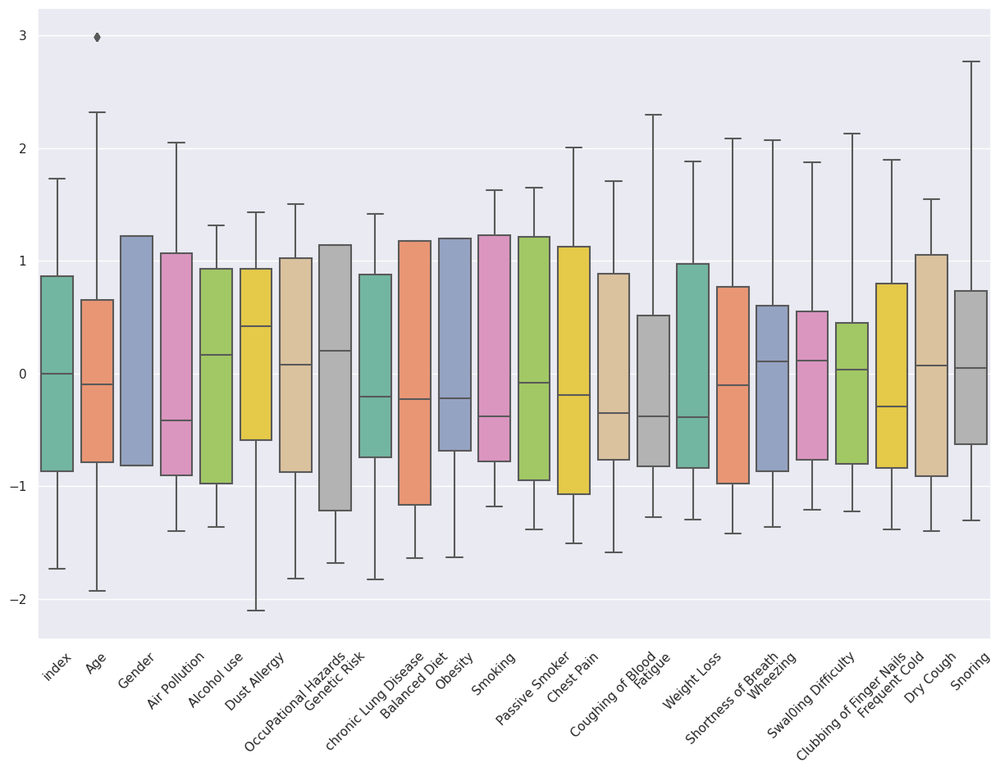

In [16]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:.25'` for same effect.
  warnings.warn(msg, FutureWarning)


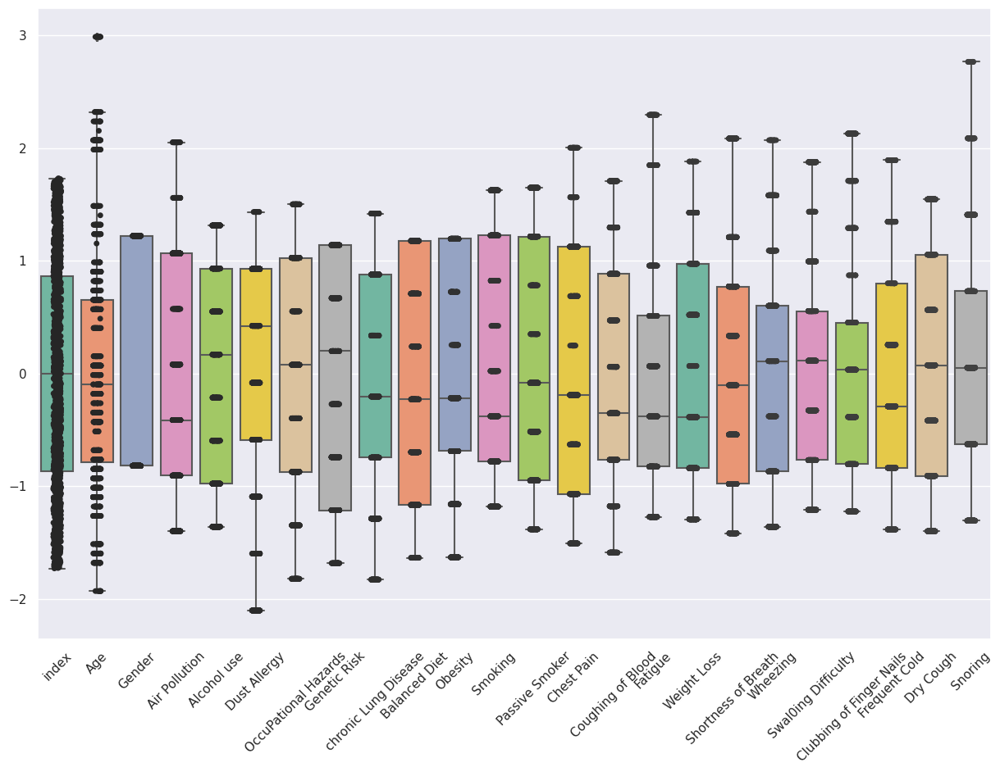

In [17]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()

ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

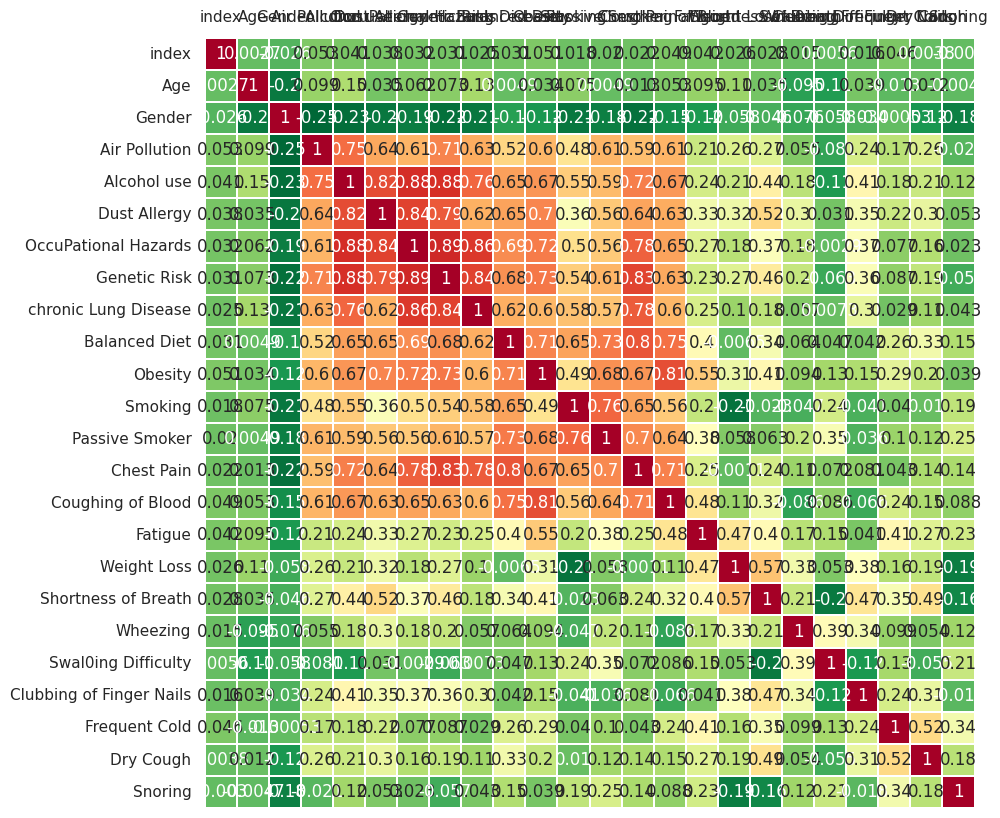

In [18]:
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

# **Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

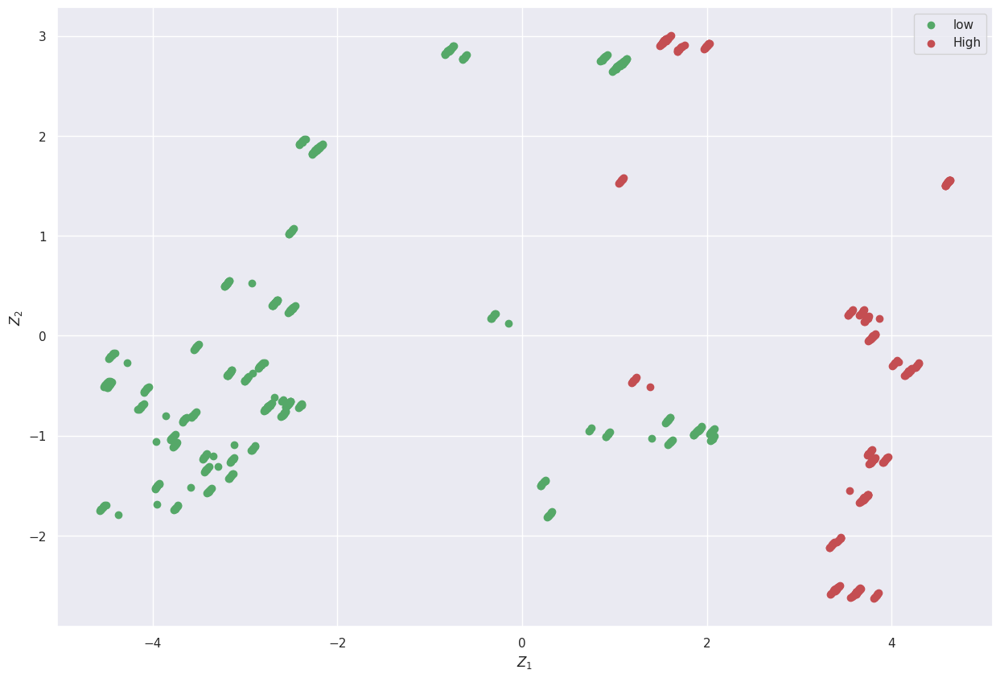

In [19]:
pca = PCA()
Z = pca.fit_transform(X)

# Level high->1,  Level low->0

idx_Benign= np.where(y == 0)
idx_Malignant = np.where(y == 1)


plt. figure(figsize=(15,10))
plt.scatter(Z[idx_Benign,0], Z[idx_Benign,1], c='g', label='low')
plt.scatter(Z[idx_Malignant,0], Z[idx_Malignant,1], c='r', label='High')


plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

array([[ 1.67486223e-02,  1.80166710e-02, -1.76980388e-02,
         1.59835008e-02, -3.90178711e-02, -8.52825248e-02,
        -9.90018249e-01, -3.43844901e-02, -5.37341979e-03,
         7.00967372e-02,  1.54741071e-02,  4.06264075e-02,
        -3.14950794e-02,  2.56809581e-02,  2.12752518e-03,
        -1.83604783e-03, -1.06042736e-02, -4.22582004e-03,
        -3.41153623e-04,  6.03590695e-03, -6.87925106e-03,
         6.50563112e-05, -6.37937480e-04,  2.43744596e-03],
       [ 3.00874213e-02,  2.08562613e-02,  1.05201340e-01,
         1.43074077e-01,  2.63274308e-01, -6.45340471e-01,
         8.25277091e-02, -5.32501782e-01, -2.25706886e-01,
         2.90889016e-01,  9.71087618e-02, -1.75535253e-01,
        -3.15097024e-02,  7.92099300e-03,  7.01838407e-03,
        -8.88651499e-02,  7.90783165e-03, -1.93585850e-04,
        -5.91382593e-02,  1.15753093e-03,  1.13392299e-02,
        -1.88479138e-02,  9.00829570e-05,  4.61073502e-02],
       [-8.49690440e-02,  3.35238592e-02,  4.13032843e

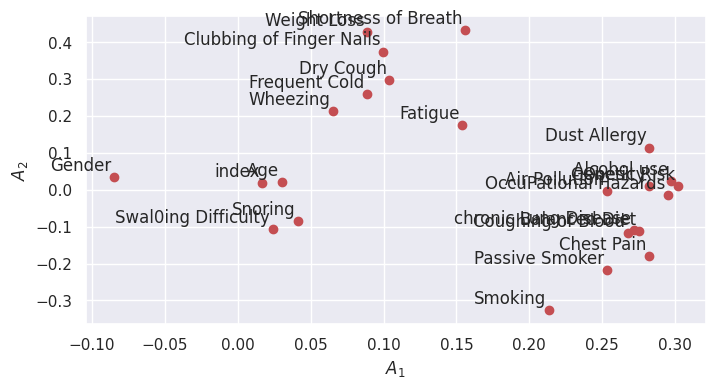

In [20]:
A = pca.components_.T
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
A

/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:967: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


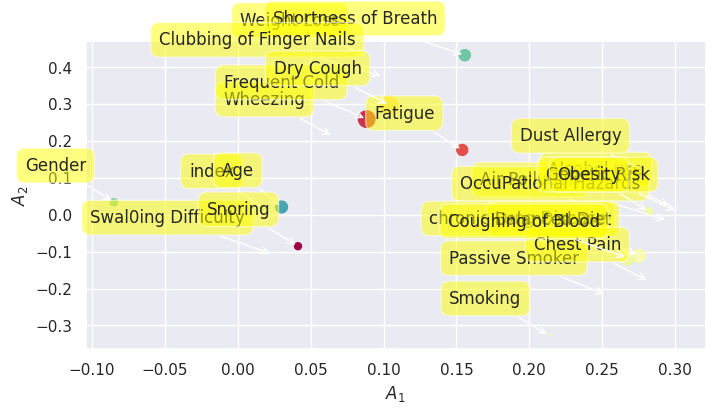

In [21]:
plt. figure(figsize=(8,4))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

array([9.11491914, 2.70347005, 2.01933267, 1.51894474, 1.30112881,
       1.21873779, 1.00002252, 0.79110623, 0.69140623, 0.60390951,
       0.50983863, 0.49910866, 0.41778418, 0.33997754, 0.28224649,
       0.22607954, 0.20779247, 0.1560015 , 0.11593722, 0.09606956,
       0.08434461, 0.06873742, 0.03327868, 0.02384981])

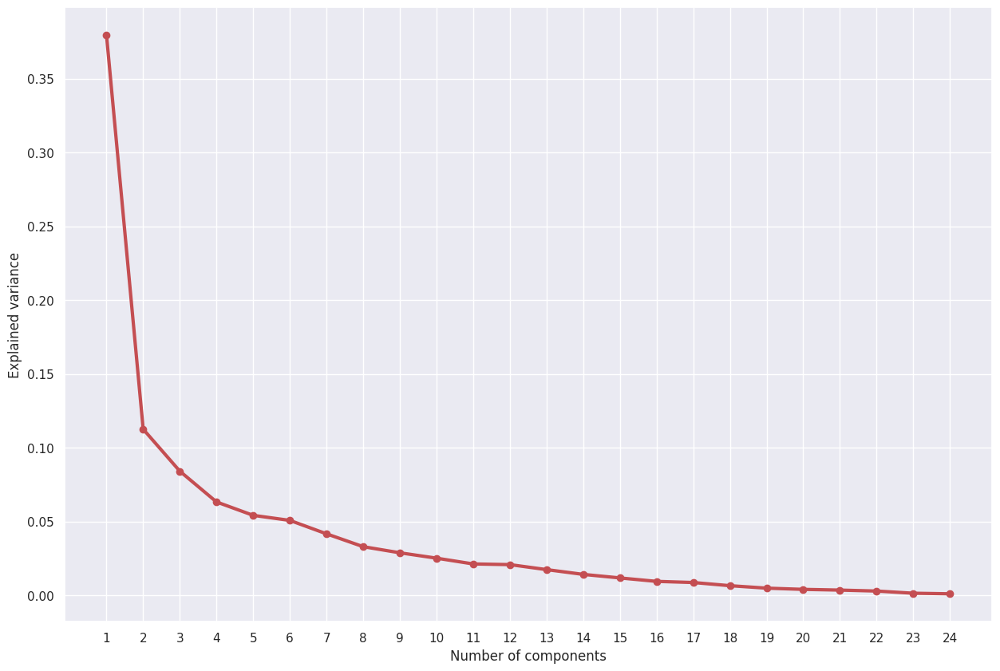

In [22]:
#Eigenvalues
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

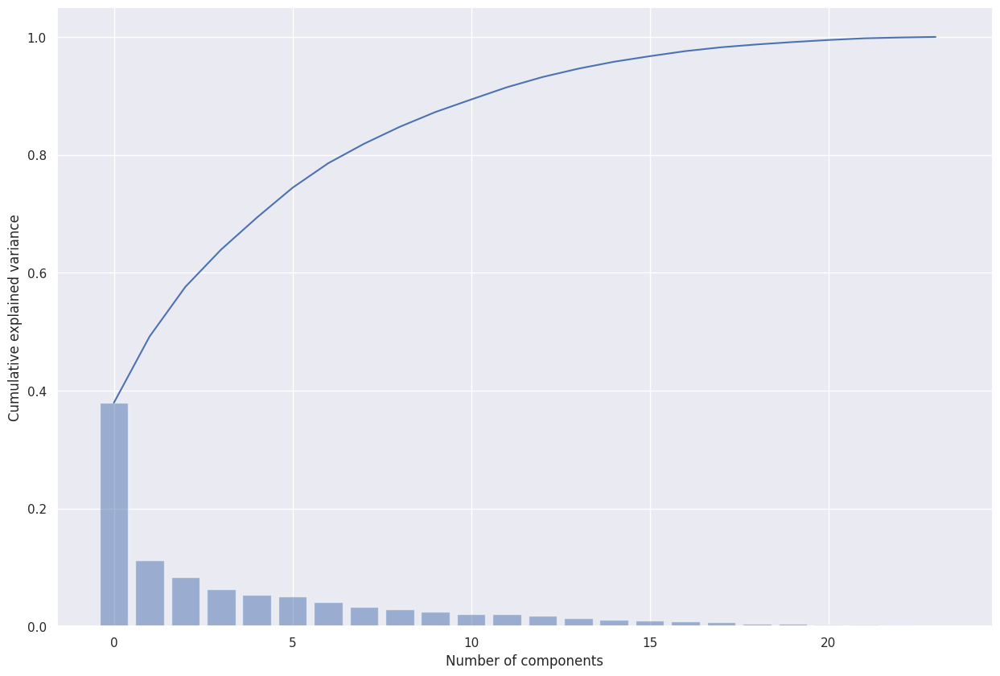

In [23]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

array([-7.15396251e-01,  1.01527209e+00,  2.84639200e+00, -1.27191051e+00,
       -2.61603339e+00,  2.84657924e+00, -6.13624054e-01, -3.96517026e-01,
       -9.52611837e-01, -7.00287408e-01, -1.65017664e+00, -2.61170749e-01,
       -1.02942140e+00, -1.27418222e+00,  4.91861921e-01, -8.73520128e-01,
        1.01620826e+00, -1.27393257e+00,  1.50264689e+00, -1.49915411e+00,
       -2.11937036e+00,  2.94723746e+00, -2.58710045e+00,  2.04503158e-01,
        1.50302136e+00,  2.71436721e+00,  2.99651107e-01,  1.81652419e+00,
       -5.38517864e-02,  2.81322829e+00, -4.70714065e-01,  1.52659592e+00,
       -9.95354685e-01, -7.13336668e-01, -4.00046200e-01, -1.49815552e+00,
        4.93234976e-01, -9.83245057e-01, -1.81696272e+00,  1.68505259e-01,
       -3.96195538e-01, -1.20592618e+00, -8.18431101e-01, -5.64632615e-01,
       -1.30742012e+00, -1.53031114e+00, -2.11774765e+00, -1.43313137e+00,
       -5.22820801e-01, -7.34882095e-01, -5.09323649e-01, -3.25373023e-01,
       -1.75127871e+00, -

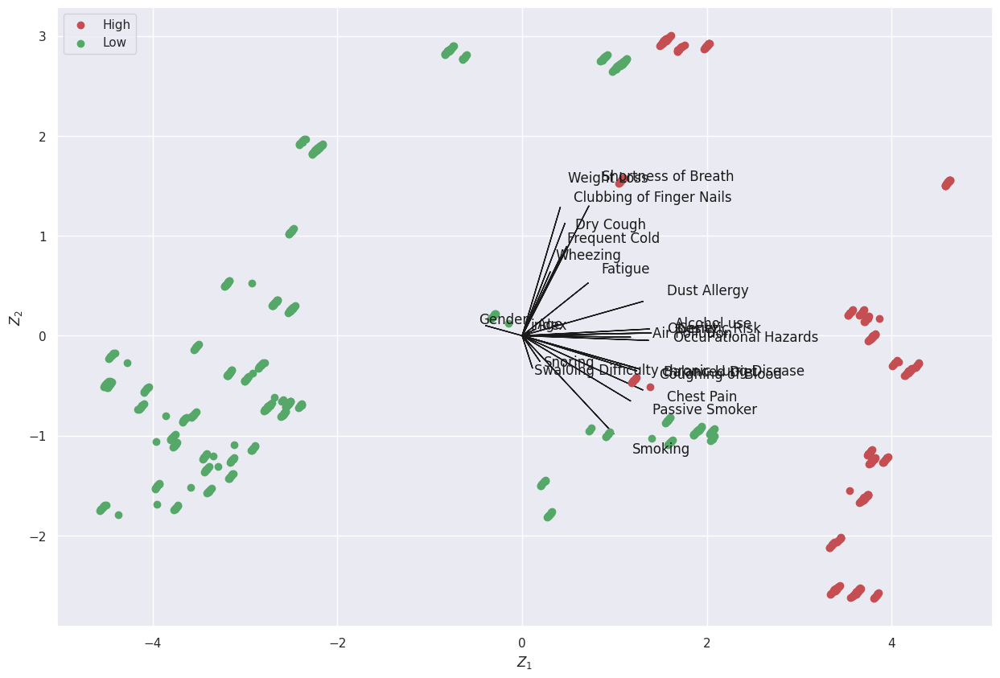

In [24]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Malignant,0], Z[idx_Malignant,1], c='r', label='High')
plt.scatter(Z[idx_Benign,0], Z[idx_Benign,1], c='g', label='Low')

plt.legend(loc='upper left')
Z1
Z2

# **Using PCA Library**

In [25]:
!pip install pca

In [26]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [24] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [15] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [24] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[15]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [27]:
out['PC']

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
0,-2.560894,-0.715396,-0.027416,0.282711,0.278495,-0.596807,1.662319,1.001025,1.128400,-0.560659,0.087636,-0.621444,-0.121695,0.934368,-0.483945
1,-2.527844,1.015272,-0.459538,-1.896115,0.122667,1.106304,1.612490,2.868281,-1.086588,1.290331,0.861622,-0.279249,-0.139405,0.484970,-0.119305
2,1.682176,2.846392,-0.397568,2.509358,-1.104052,-0.609161,1.894201,1.300907,0.501962,0.016538,-0.584892,-0.056846,0.230087,-0.174152,-0.121881
3,3.902025,-1.271911,-0.914975,1.732061,1.645755,0.820127,1.612018,0.195871,-0.482320,-1.171249,-0.442548,-0.171272,-0.661056,0.116121,-0.307050
4,3.569999,-2.616033,0.561186,0.964386,0.095085,-0.500872,1.700603,0.029504,-0.215834,-0.479669,-0.428025,-0.969912,0.797703,0.464981,0.156773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3.741660,-1.588701,-1.519548,-1.413059,0.161394,-0.708741,-1.623024,0.116094,-1.080043,0.576700,0.291169,-0.684417,-0.564098,-0.739102,-0.319687
996,4.060556,-0.246624,-0.378036,-0.974140,-1.575113,-0.446604,-1.522991,-1.441981,1.642336,-0.115221,1.637560,1.029075,0.723144,-0.694296,-0.062802
997,1.541532,2.959485,-0.462000,2.556135,-2.383902,0.550866,-1.555944,0.265258,0.498938,0.031469,-0.087522,0.314870,-0.185549,0.072559,-0.009979
998,3.384164,-2.534289,0.339006,0.796488,-1.579559,1.627504,-1.869910,-0.207240,0.119736,-0.901333,-0.076377,-0.335022,0.429443,0.699721,0.258139


**Scatter plot**

[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


[scatterd] >INFO> Create scatterplot


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot: title={'center': '15 Principal Components explain [96.72%] of the variance'}, xlabel='PC1 (37.9% expl.var)', ylabel='PC2 (11.2% expl.var)'>)

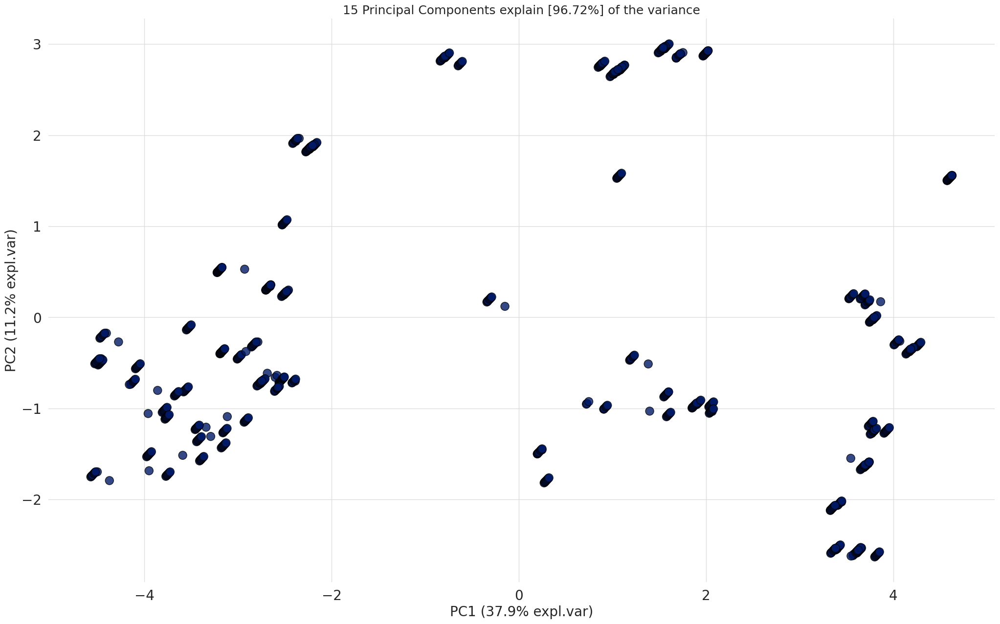

In [28]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [29]:
A = out['loadings'].T
A

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
index,0.016749,0.018017,-0.017698,0.015984,-0.039018,-0.085283,-0.990018,-0.034384,-0.005373,0.070097,0.015474,0.040626,-0.031495,0.025681,0.002128
Age,0.030087,0.020856,0.105201,0.143074,0.263274,-0.645340,0.082528,-0.532502,-0.225707,0.290889,0.097109,-0.175535,-0.031510,0.007921,0.007018
Gender,-0.084969,0.033524,0.041303,0.054384,-0.454000,0.449201,0.015204,-0.667254,-0.084626,0.007718,0.257390,0.041872,-0.163437,0.080800,0.054138
Air Pollution,0.253336,-0.004705,0.120081,0.049571,0.058926,-0.062222,-0.039103,0.128602,-0.285313,-0.519498,0.408580,-0.074971,-0.060965,-0.148898,0.069732
Alcohol use,0.297271,0.022396,0.158403,-0.022298,0.158348,0.041360,-0.018441,-0.105909,0.090750,-0.107708,0.119970,-0.137006,0.148381,0.140390,-0.013268
Dust Allergy,0.282207,0.114223,0.060464,-0.091028,0.004408,0.062098,-0.003379,0.069653,0.091025,0.074737,0.122257,-0.381095,-0.062132,0.221026,-0.363646
OccuPational Hazards,0.295132,-0.015703,0.171947,-0.099906,0.042821,0.080935,-0.004401,-0.078789,0.167176,0.070314,-0.219197,-0.115573,-0.184743,0.015359,-0.200426
Genetic Risk,0.301729,0.009049,0.202517,-0.092102,0.020896,0.044581,0.002393,0.021850,0.009124,0.041301,-0.041612,0.012908,-0.022413,-0.054781,0.264563
chronic Lung Disease,0.272078,-0.109942,0.169096,-0.063468,0.099407,0.004525,0.002973,-0.148923,0.058772,-0.074893,-0.291705,0.204369,-0.368721,-0.265331,0.131678
Balanced Diet,0.275259,-0.111347,-0.099793,0.163742,-0.080874,0.148220,0.016723,0.008425,-0.040431,0.356969,0.080929,0.055043,0.073761,-0.118639,-0.029697


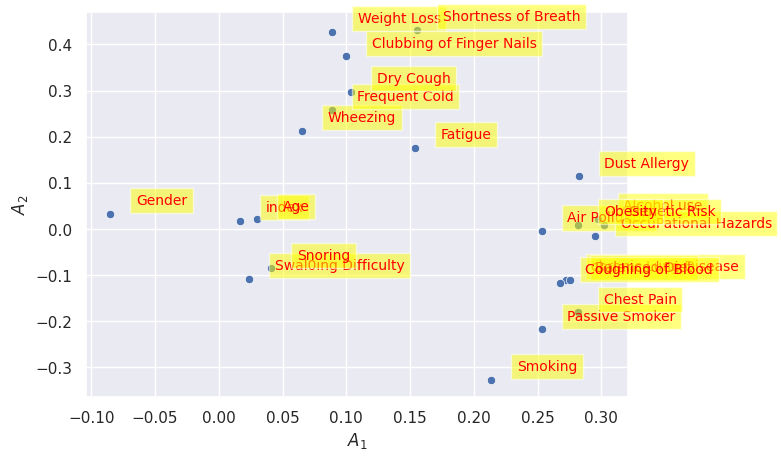

In [30]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))


**Scree Plot**

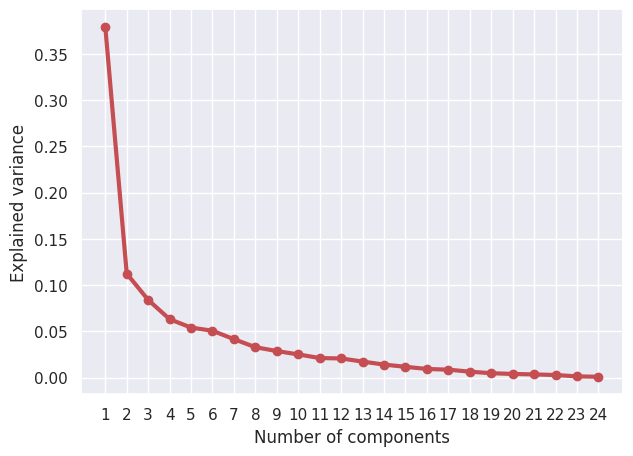

In [31]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

**Explained Variance Plot**

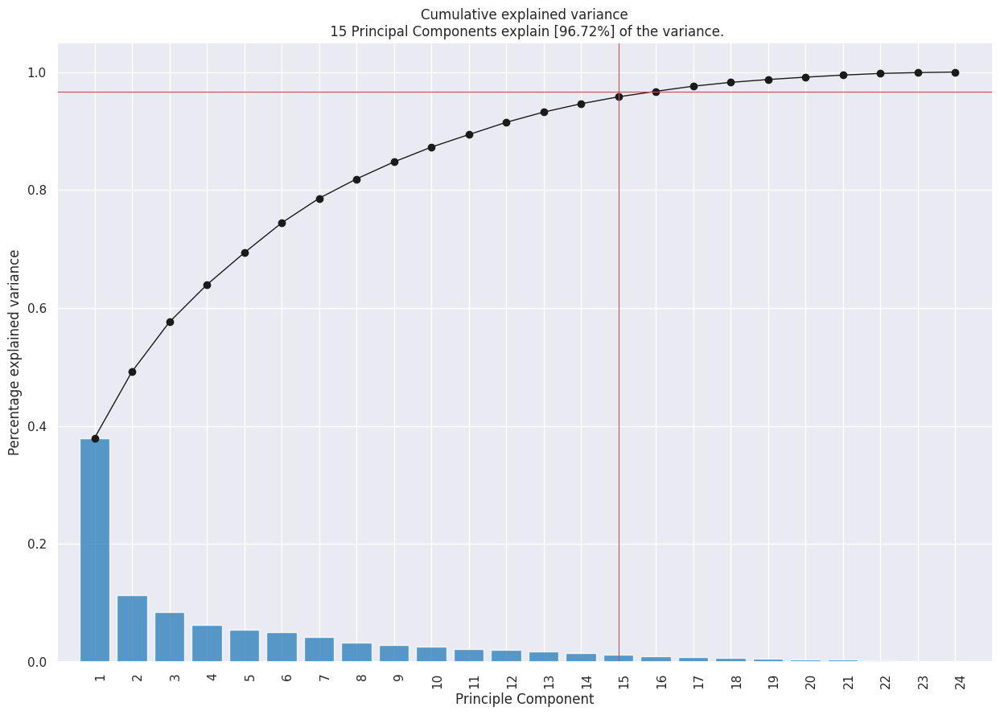

In [32]:
model.plot();

**Biplot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot: title={'center': '15 Principal Components explain [96.72%] of the variance'}, xlabel='PC1 (37.9% expl.var)', ylabel='PC2 (11.2% expl.var)'>)

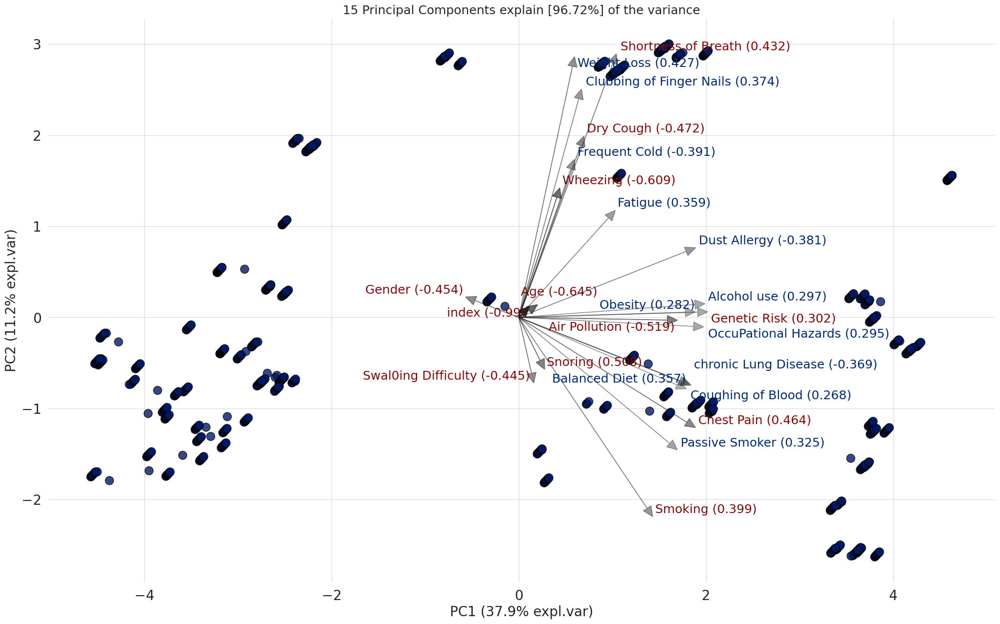

In [33]:
model.biplot(label=False, legend=False, color_arrow='k')

[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


(<Figure size 3000x2500 with 1 Axes>,
 <Axes3DSubplot: title={'center': '15 Principal Components explain [96.72%] of the variance'}, xlabel='PC1 (37.9% expl.var)', ylabel='PC2 (11.2% expl.var)', zlabel='PC3 (8.40% expl.var)'>)

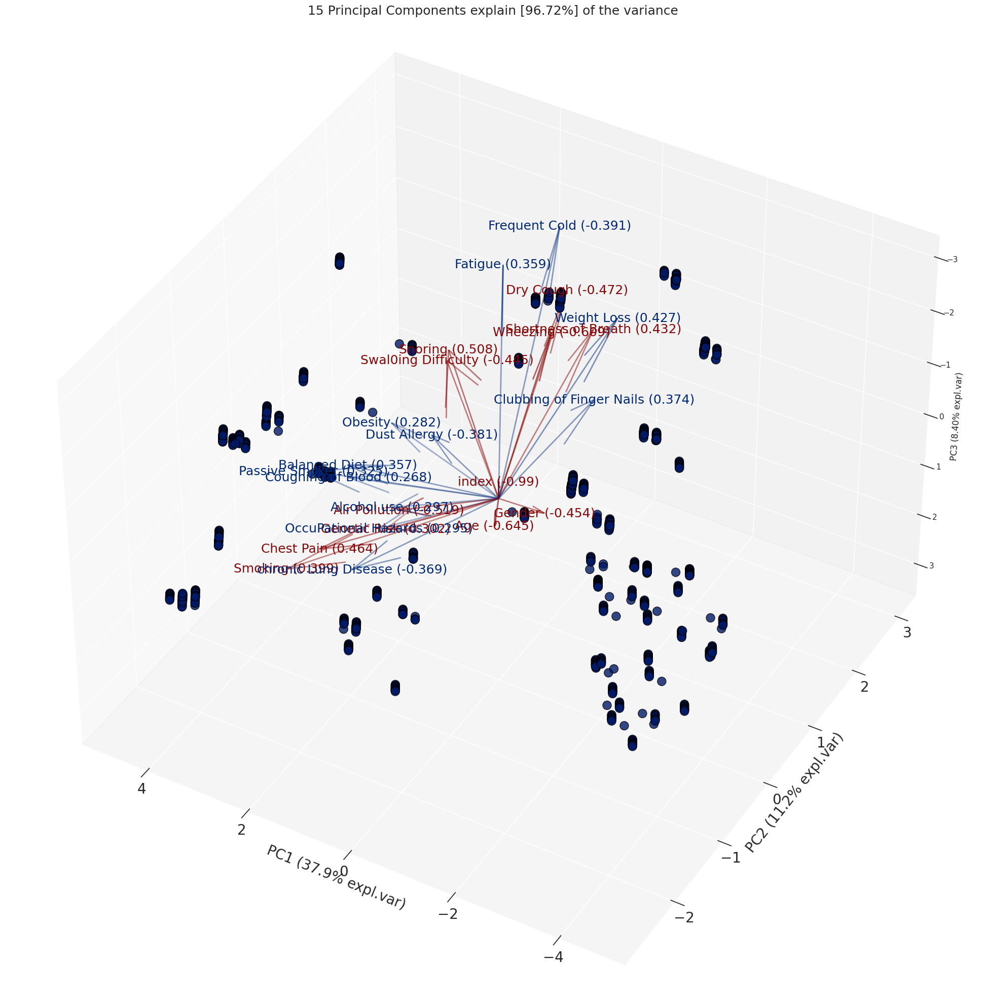

In [34]:
model.biplot3d(legend=False)

# Classification using Pycaret
At first dataset is split into train and test set with 70% and 30% ratio respectively. Then using the PyCaret compare_models() function, the models which shows the highest accuracy on the original dataset can be found.
Before applying PCA, the output from compare_models() function shows that Logistic regression, Decision tree Classifier and Random tree classifier shows the best performance.

 However, after applying PCA, the these models performance decreases and Logistic support Vector MAchine, and Random forest classifier shows the highest performance. Therefore, I have taken those three as my classification algorithms and applied these three models on the original dataset before applying PCA and after applying PCA respectively.

In [35]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'3.0.0'

In [36]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (900, 25)
Unseen Data For Predictions: (100, 25)


In [37]:
from pycaret.classification import *
clf = setup(data=data, target='Level', train_size=0.7, session_id=123)

,Description,Value
0,Session id,123
1,Target,Level
2,Target type,Binary
3,Original data shape,"(900, 25)"
4,Transformed data shape,"(900, 25)"
5,Transformed train set shape,"(630, 25)"
6,Transformed test set shape,"(270, 25)"
7,Numeric features,24
8,Preprocess,True
9,Imputation type,simple


**Comparing All Models**

In [38]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.2770
dt,Decision Tree Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.1820
rf,Random Forest Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.9140
qda,Quadratic Discriminant Analysis,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.2720
ada,Ada Boost Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.5670
gbc,Gradient Boosting Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.3260
et,Extra Trees Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.6290
xgboost,Extreme Gradient Boosting,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.1340
lightgbm,Light Gradient Boosting Machine,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.2800
catboost,CatBoost Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.9860


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

In [39]:
best_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

 Create a Model

**Logistic Regresssion**

In [40]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune the model**

In [41]:
tuned_lr=tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [42]:
tuned_lr

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [43]:
!pip install --upgrade pycaret

  Using cached pycaret-3.2.0-py3-none-any.whl (484 kB)
  Attempting uninstall: pycaret
    Found existing installation: pycaret 3.0.0
    Uninstalling pycaret-3.0.0:
      Successfully uninstalled pycaret-3.0.0


**Evaluate Logistic Regression**


In [44]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create model with Decision tree classifier**

In [45]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune model with decision tree classifier**

In [46]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [47]:
tuned_dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       random_state=123, splitter='best')

**Evaluate model with Decision tree classifier**

In [48]:
evaluate_model(tuned_dt)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create model with Random forest Classifier**

In [49]:
rf=create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune the RFC Model**

In [50]:
tuned_rf=tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [51]:
tuned_rf

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)

**Evaluate the RFC Model**

In [52]:
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [53]:
!pip install statsmodels --upgrade

# **Classification + PCA**

In [54]:
clf_pca = setup(data=data, target='Level', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 15)

,Description,Value
0,Session id,123
1,Target,Level
2,Target type,Binary
3,Original data shape,"(900, 25)"
4,Transformed data shape,"(900, 16)"
5,Transformed train set shape,"(630, 16)"
6,Transformed test set shape,"(270, 16)"
7,Numeric features,24
8,Preprocess,True
9,Imputation type,simple


# **Comparing Models**

In [55]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.2240
svm,SVM - Linear Kernel,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.2660
rf,Random Forest Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0140
et,Extra Trees Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.8480
catboost,CatBoost Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,5.1990
dt,Decision Tree Classifier,0.9984,0.9988,1.0000,0.9957,0.9978,0.9965,0.9966,0.2400
gbc,Gradient Boosting Classifier,0.9984,1.0000,0.9955,1.0000,0.9977,0.9965,0.9965,1.0930
qda,Quadratic Discriminant Analysis,0.9968,1.0000,0.9909,1.0000,0.9952,0.9929,0.9931,0.2950
ada,Ada Boost Classifier,0.9968,1.0000,0.9955,0.9957,0.9955,0.9930,0.9931,0.6330
knn,K Neighbors Classifier,0.9952,1.0000,0.9864,1.0000,0.9929,0.9893,0.9896,0.1380


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

# **Best model with PCA**

In [56]:
best_model_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

# **Tune Best Model**

In [57]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


# **Evaluate Best Model**

In [58]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [59]:
lr_pca = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

# **Tune Model**

In [60]:
tuned_lr_pca = tune_model(lr_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [61]:
tuned_lr_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [62]:
evaluate_model(tuned_lr_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# **Create Support Vector Machine Model**

In [63]:
svm_pca = create_model('svm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune Model**

In [64]:
tuned_svm_pca = tune_model(svm_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9841,0.0000,1.0000,0.9565,0.9778,0.9654,0.9660
5,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [65]:
tuned_svm_pca

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.001, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=-1, penalty='l2',
              power_t=0.5, random_state=123, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

**Evaluate Model**

In [66]:
evaluate_model(tuned_svm_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# **Create Random forest Model**

In [67]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune model**

In [68]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
4,0.9841,1.0000,1.0000,0.9565,0.9778,0.9654,0.9660
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


**Evaluate Model**

In [69]:
tuned_rf_pca

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)

In [70]:
evaluate_model(tuned_rf_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# Explainable AI with Shapley values
For binary classification, AI shapley can only support tree based classification models. As Random forest Classifier is one of the the best three models [LR, SVM, RFC] with highest accuracy based on tree, I chose the it as best model for the AI Shapley analysis.

In [71]:
%pip install shap

In [72]:
import shap
%pip install pycaret[analysis]
!pip install --upgrade pycaret[full]

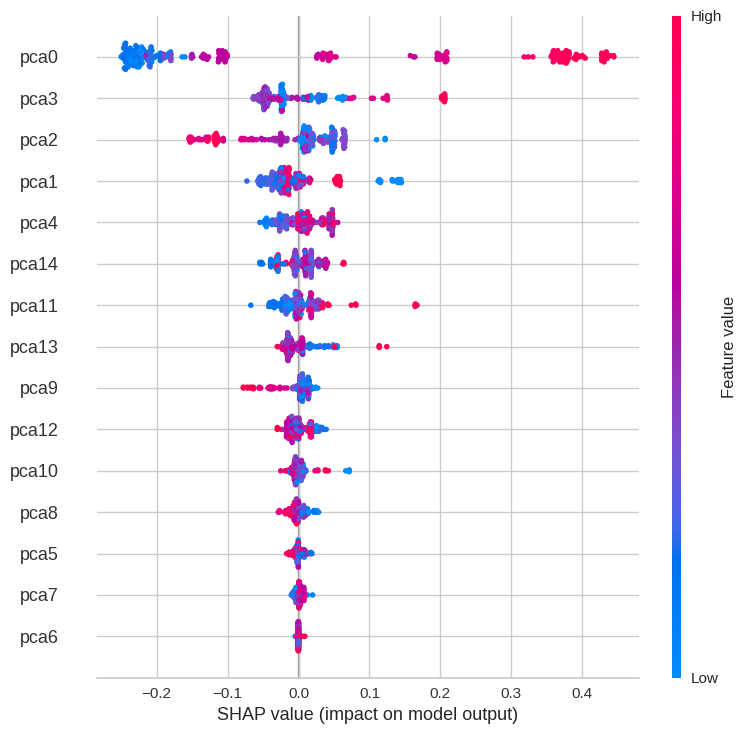

In [73]:
from pycaret.classification import interpret_model
interpret_model(tuned_rf_pca, plot='summary')

In [74]:
interpret_model(tuned_rf_pca, plot='reason', observation=32)

In [75]:
interpret_model(tuned_rf_pca, plot='reason')